# Master's Thesis: Investigating Maximum Rainfall Trends in Colorado

<b>Institution:</b> University of Georgia <br>
<b>Department:</b> Statistics <br>
<b>Student:</b> Jeremy Mulcahey <br>
<b>Advisor:</b> Dr. Lynne Seymour <br>
<b>Last Edit:</b> 9/28/2016

In [1]:
# establish working directorys
setwd("C:/Users/jerem/Desktop/UGA/Master'sThesis/")

In [2]:
data = read.csv(file = "data/BOULDER_MonMax_GHCN.csv", head=T)
data = rbind(data,read.csv(file = "data/FORT_MonMax_GHCN.csv", head=T),read.csv(file = "data/LAKEWOOD_MonMax_GHCN.csv", head=T),
        read.csv(file = "data/GREELEY_MonMax_GHCN.csv", head=T),read.csv(file = "data/EVERGREEN_MonMax_GHCN.csv", head=T))

In [3]:
names(data)

[1] "STATION"      "STATION_NAME" "YEAR"         "MONTH"        "Obs"         
[6] "Max.PRCP."

In [4]:
stations = unique(data$STATION_NAME)

In [5]:
require(ggmap)

Loading required package: ggmap
Loading required package: ggplot2


In [6]:
 gc = geocode("denver colorado")

Information from URL : http://maps.googleapis.com/maps/api/geocode/json?address=denver%20colorado&sensor=false


In [7]:
map = get_map("erie colorado", zoom=9)

Map from URL : http://maps.googleapis.com/maps/api/staticmap?center=erie+colorado&zoom=9&size=640x640&scale=2&maptype=terrain&language=en-EN&sensor=false
Information from URL : http://maps.googleapis.com/maps/api/geocode/json?address=erie%20colorado&sensor=false


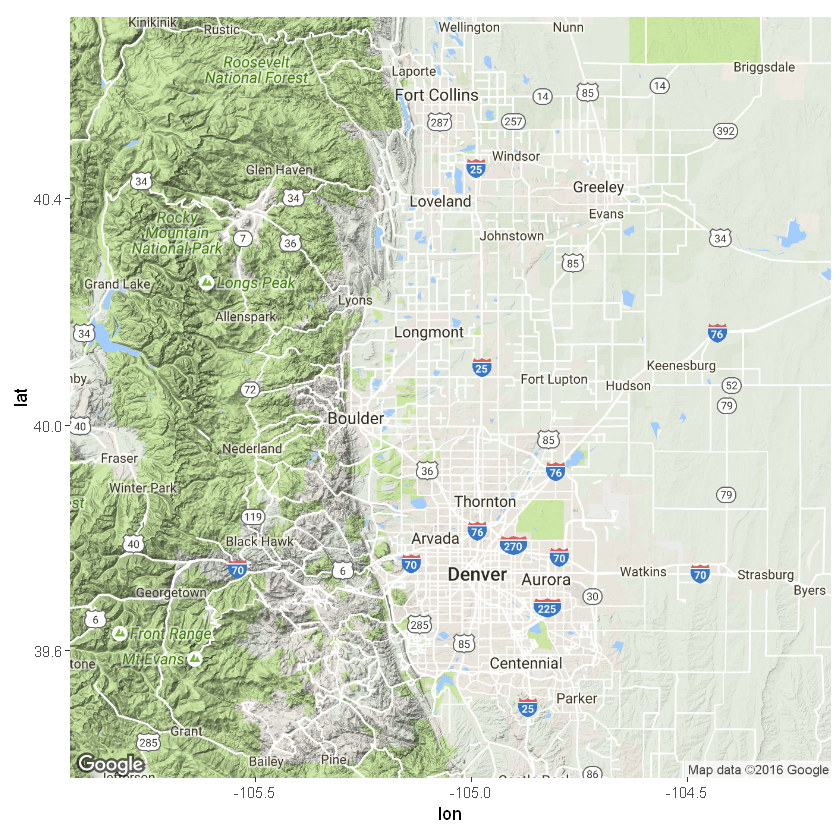

In [8]:
ggmap(map)

In [9]:
gcEG = geocode("evergreen colorado")
gcG = geocode("greeley colorado")
gcFC = geocode("fort collins colorado")
gcB = geocode("boulder colorado")
gcL = geocode("lakewood colorado")

Information from URL : http://maps.googleapis.com/maps/api/geocode/json?address=evergreen%20colorado&sensor=false
Information from URL : http://maps.googleapis.com/maps/api/geocode/json?address=greeley%20colorado&sensor=false
Information from URL : http://maps.googleapis.com/maps/api/geocode/json?address=fort%20collins%20colorado&sensor=false
Information from URL : http://maps.googleapis.com/maps/api/geocode/json?address=boulder%20colorado&sensor=false
Information from URL : http://maps.googleapis.com/maps/api/geocode/json?address=lakewood%20colorado&sensor=false


In [10]:
gcEG;gcFC;gcL;gcB;gcG

lon,lat
-105.3172,39.63332


lon,lat
-105.0844,40.58526


lon,lat
-105.0814,39.70471


lon,lat
-105.2705,40.01499


lon,lat
-104.7091,40.42331


In [11]:
stations

[1] BOULDER CO US      FORT COLLINS CO US LAKEWOOD CO US     GREELEY CO US     
[5] GREELEY UNC CO US  EVERGREEN CO US   
6 Levels: BOULDER CO US FORT COLLINS CO US LAKEWOOD CO US ... EVERGREEN CO US

In [12]:
for(i in 1:nrow(data)){
    if(data$STATION_NAME[i] == stations[1]){
        data[i,'lon'] = gcB[[1]]
        data[i,'lat'] = gcB[[2]]
    }else if(data$STATION_NAME[i] == stations[2]){
        data[i,'lon'] = gcFC[[1]]
        data[i,'lat'] = gcFC[[2]] 
    }else if(data$STATION_NAME[i] == stations[3]){
        data[i,'lon'] = gcL[[1]]
        data[i,'lat'] = gcL[[2]] 
    }else if(data$STATION_NAME[i] == stations[6]){
        data[i,'lon'] = gcEG[[1]]
        data[i,'lat'] = gcEG[[2]] 
    }else{
        data[i,'lon'] = gcG[[1]]
        data[i,'lat'] = gcG[[2]]
    }
}

In [86]:
gcs=NULL

In [87]:
gcs = rbind(gcB,gcG,gcEG,gcFC,gcL)

In [88]:
n=1000
for(i in 1:n){
    gcs = rbind(gcs,gcB,gcG,gcEG,gcFC,gcL)
}

In [89]:
table(gcs)

              lat
lon            39.6333213 39.7047095 40.0149856 40.4233142 40.5852602
  -105.3172146       1001          0          0          0          0
  -105.2705456          0          0       1001          0          0
  -105.084423           0          0          0          0       1001
  -105.0813734          0       1001          0          0          0
  -104.7091322          0          0          0       1001          0

In [134]:
jpeg("pics/geoIntro.jpg")
ggmap(map) + stat_density2d(
aes(x = lon, y = lat, fill = ..level.., alpha = ..level..),
size = 10, bins = 10, data = gcs,
geom = "polygon"
) + scale_fill_gradient(low = "black", high = "red")+theme(legend.position = "none")
dev.off()

png 
  2

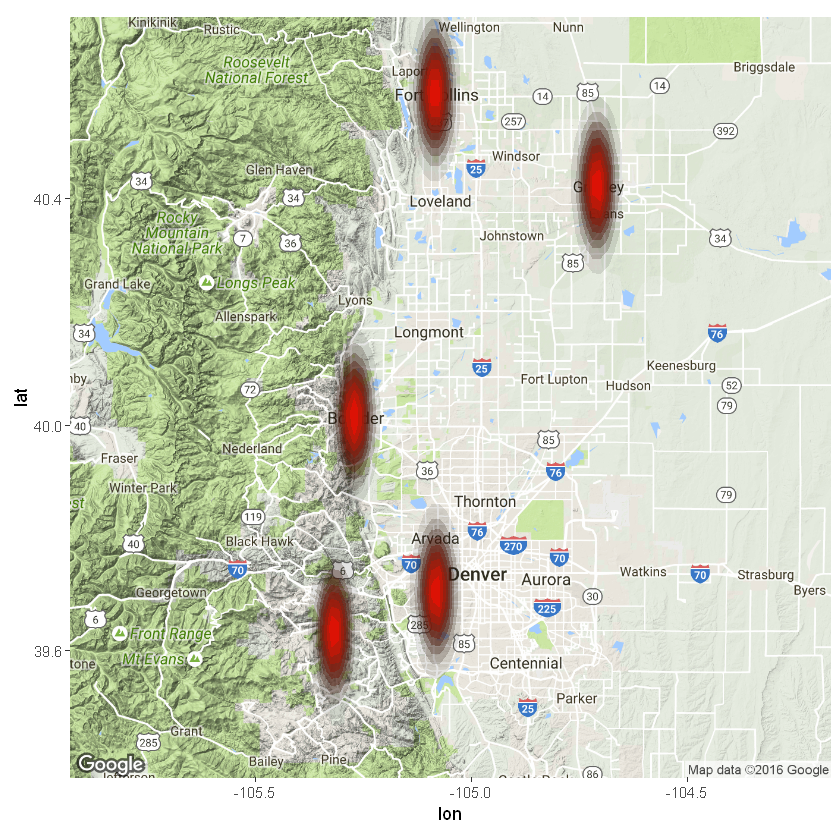

In [135]:
ggmap(map) + stat_density2d(
aes(x = lon, y = lat, fill = ..level.., alpha = ..level..),
size = 10, bins = 10, data = gcs,
geom = "polygon"
) + scale_fill_gradient(low = "black", high = "red")+theme(legend.position = "none")

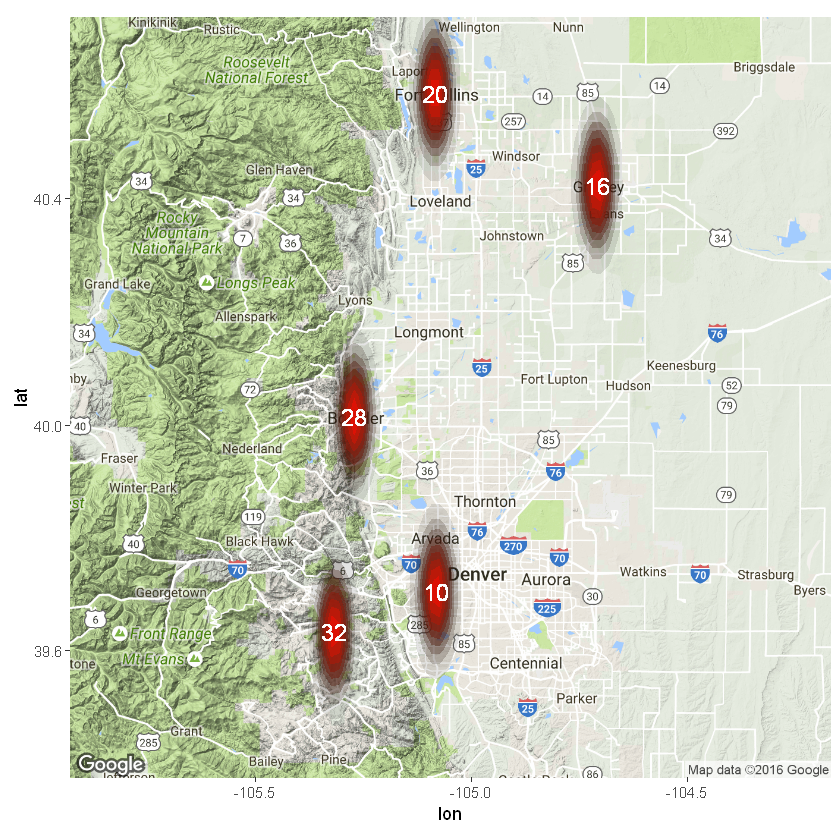

In [136]:
ggmap(map) + stat_density2d(
aes(x = lon, y = lat, fill = ..level.., alpha = ..level..),
size = 10, bins = 10, data = gcs,
geom = "polygon"
) + scale_fill_gradient(low = "black", high = "red") + geom_text(data=NULL,
            label = "32", x = -105.3172146, y = 39.6333213, size = 5, colour = "white")+ geom_text(data=NULL,
            label = "28", x = -105.2705456, y = 40.0149856, size = 5, colour = "white")+ geom_text(data=NULL,
            label = "20", x = -105.084423, y = 40.5852602, size = 5, colour = "white")+ geom_text(data=NULL,
            label = "10", x = -105.0813734, y = 39.7047095, size = 5, colour = "white")+ geom_text(data=NULL,
            label = "16", x = -104.7091322, y = 40.4233142, size = 5, colour = "white")+theme(legend.position = "none")

## Start actual subsets for geospatial eda

## 1 INCH RAINFALL

1 inch of rain approx 25.4mm, 2 inch approx 50.8, 3 inch approx 76.2mm.

In [20]:
data[which(data$STATION_NAME=="GREELEY UNC CO US"),"STATION_NAME"] = "GREELEY CO US"

In [28]:
data = droplevels(data)

In [41]:
stations = unique(data$STATION_NAME)

Exceed 1 inch of rain in recorded 24 hour periods. (full data ranges)

In [137]:
data1inch = data[which(data$Max.PRCP.>=254),]

In [138]:
labels = as.character(table(data1inch$STATION_NAME))

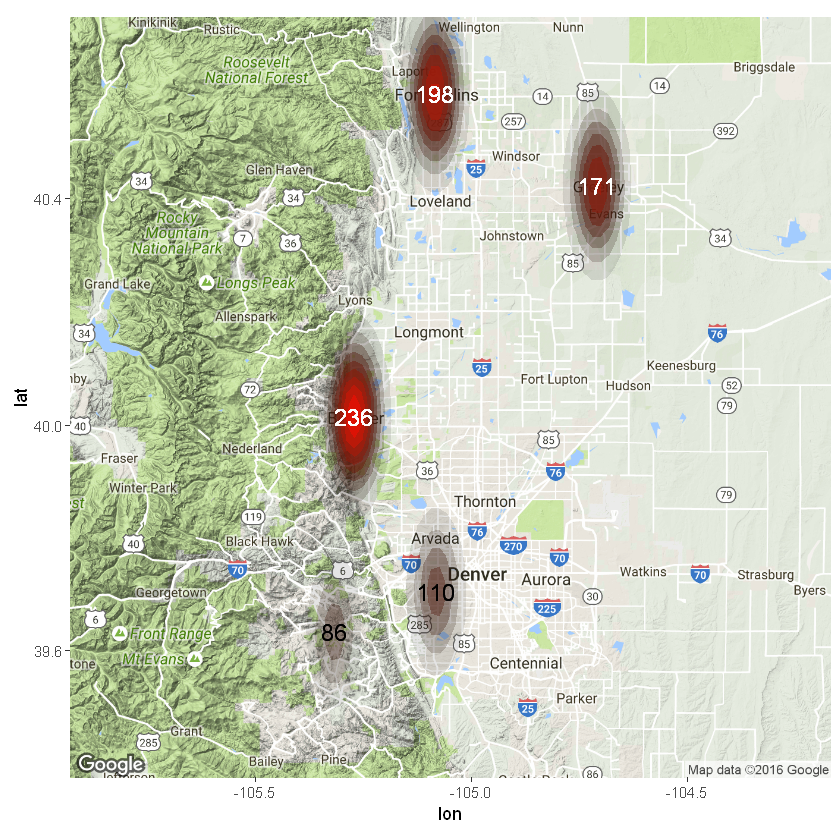

In [139]:
ggmap(map) + stat_density2d(
aes(x = lon, y = lat, fill = ..level.., alpha = ..level..),
size = 10, bins = 10, data = data1inch,
geom = "polygon"
) + scale_fill_gradient(low = "black", high = "red") + geom_text(data=NULL,
            label = labels[1], x = -105.2705456, y = 40.0149856, size = 5, colour = "white")+ geom_text(data=NULL,
            label = labels[2], x = -105.084423, y = 40.5852602, size = 5, colour = "white")+ geom_text(data=NULL,
            label = labels[3], x = -105.0813734, y = 39.7047095, size = 5, colour = "black")+ geom_text(data=NULL,
            label = labels[4], x = -104.7091322, y = 40.4233142, size = 5, colour = "white")+ geom_text(data=NULL,
            label = labels[5], x = -105.3172146, y = 39.6333213, size = 5, colour = "black")+theme(legend.position = "none")       

Warning message:
: Computation failed in `stat_density2d()`:
bandwidths must be strictly positive

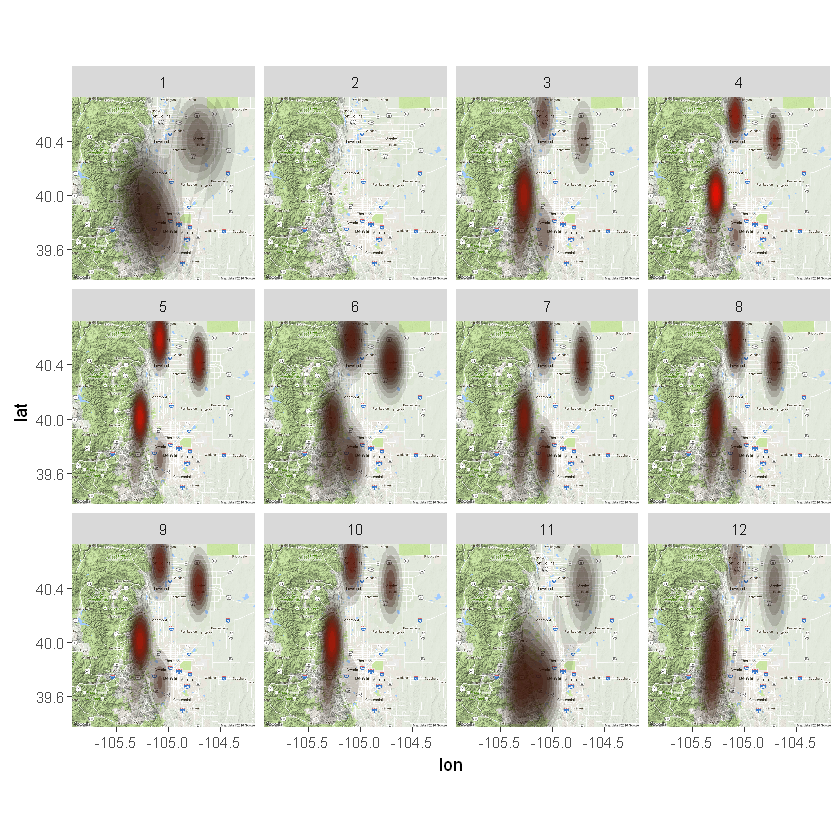

In [140]:
ggmap(map) + stat_density2d(
aes(x = lon, y = lat, fill = ..level.., alpha = ..level..),
size = 10, bins = 10, data = data1inch,
geom = "polygon"
) + scale_fill_gradient(low = "black", high = "red") + facet_wrap(~ MONTH)+theme(legend.position = "none")

Seems unreasonable to compare the full data ranges. Investigate common start date.

In [42]:
mins = NULL
for(name in stations){
    mins=c(mins,min(data[which(data$STATION_NAME==name),"YEAR"]))
}

In [43]:
mins

[1] 1898 1896 1963 1893 1962

Looks like 1962 is our winner.

In [141]:
data1inch = data[which(data$Max.PRCP.>=254 & data$YEAR >1961),]

In [142]:
labels = as.character(table(data1inch$STATION_NAME))

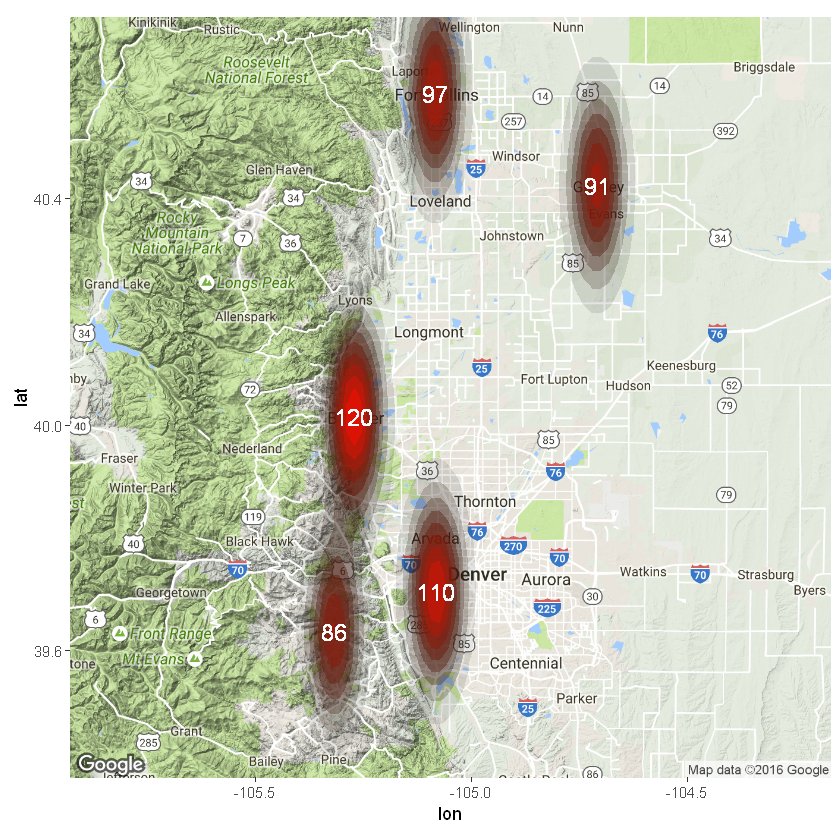

In [143]:
ggmap(map) + stat_density2d(
aes(x = lon, y = lat, fill = ..level.., alpha = ..level..),
size = 10, bins = 10, data = data1inch,
geom = "polygon"
) + scale_fill_gradient(low = "black", high = "red") + geom_text(data=NULL,
            label = labels[1], x = -105.2705456, y = 40.0149856, size = 5, colour = "white")+ geom_text(data=NULL,
            label = labels[2], x = -105.084423, y = 40.5852602, size = 5, colour = "white")+ geom_text(data=NULL,
            label = labels[3], x = -105.0813734, y = 39.7047095, size = 5, colour = "white")+ geom_text(data=NULL,
            label = labels[4], x = -104.7091322, y = 40.4233142, size = 5, colour = "white")+ geom_text(data=NULL,
            label = labels[5], x = -105.3172146, y = 39.6333213, size = 5, colour = "white") +theme(legend.position = "none")          

Warning message:
: Computation failed in `stat_density2d()`:
missing value where TRUE/FALSE needed

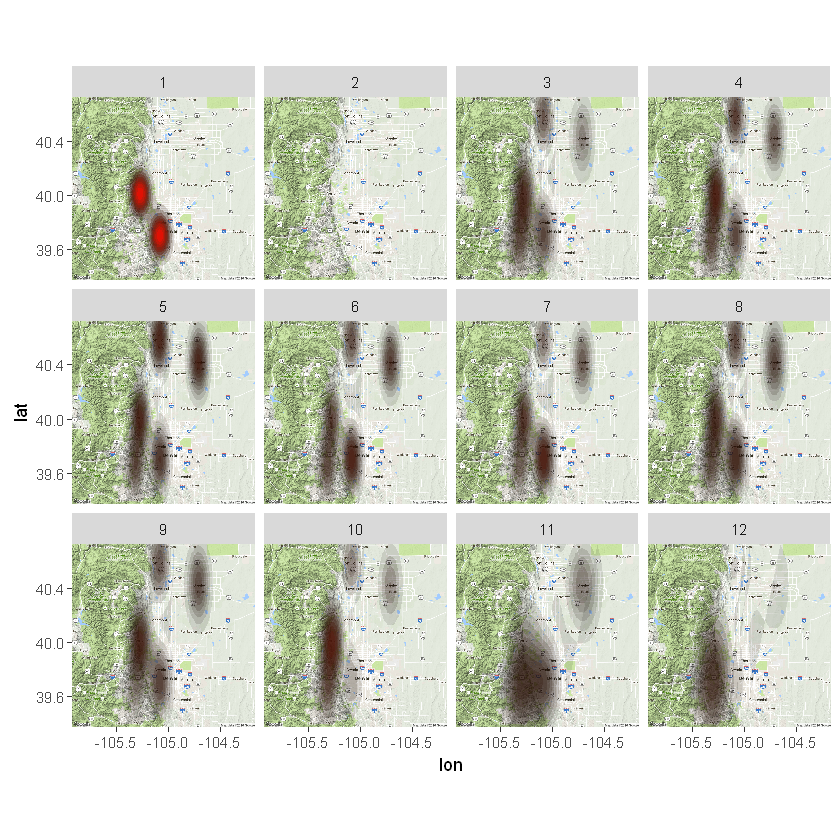

In [144]:
ggmap(map) + stat_density2d(
aes(x = lon, y = lat, fill = ..level.., alpha = ..level..),
size = 10, bins = 10, data = data1inch,
geom = "polygon"
) + scale_fill_gradient(low = "black", high = "red") + facet_wrap(~ MONTH)+theme(legend.position = "none")

## 2 INCH RAINFALL

In [145]:
data2inch = data[which(data$Max.PRCP.>=508),]

In [146]:
labels = as.character(table(data2inch$STATION_NAME))

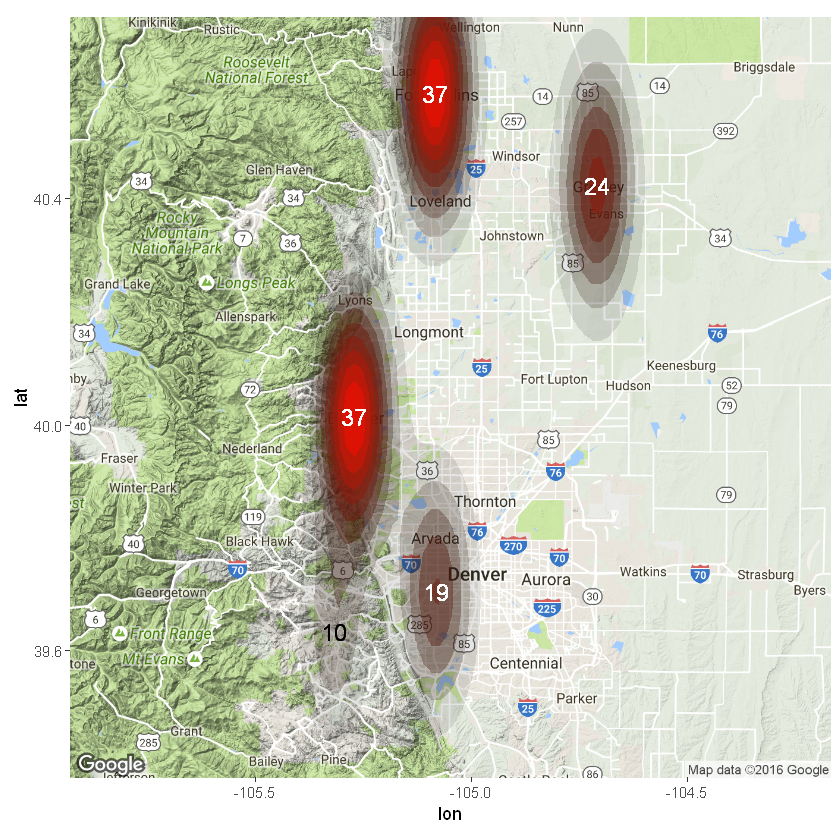

In [147]:
ggmap(map) + stat_density2d(
aes(x = lon, y = lat, fill = ..level.., alpha = ..level..),
size = 10, bins = 10, data = data2inch,
geom = "polygon"
) + scale_fill_gradient(low = "black", high = "red") + geom_text(data=NULL,
            label = labels[1], x = -105.2705456, y = 40.0149856, size = 5, colour = "white")+ geom_text(data=NULL,
            label = labels[2], x = -105.084423, y = 40.5852602, size = 5, colour = "white")+ geom_text(data=NULL,
            label = labels[3], x = -105.0813734, y = 39.7047095, size = 5, colour = "white")+ geom_text(data=NULL,
            label = labels[4], x = -104.7091322, y = 40.4233142, size = 5, colour = "white")+ geom_text(data=NULL,
            label = labels[5], x = -105.3172146, y = 39.6333213, size = 5, colour = "black")+theme(legend.position = "none")           

In [148]:
data2inch = data[which(data$Max.PRCP.>=508 & data$YEAR >1961),]

In [149]:
labels = as.character(table(data2inch$STATION_NAME))

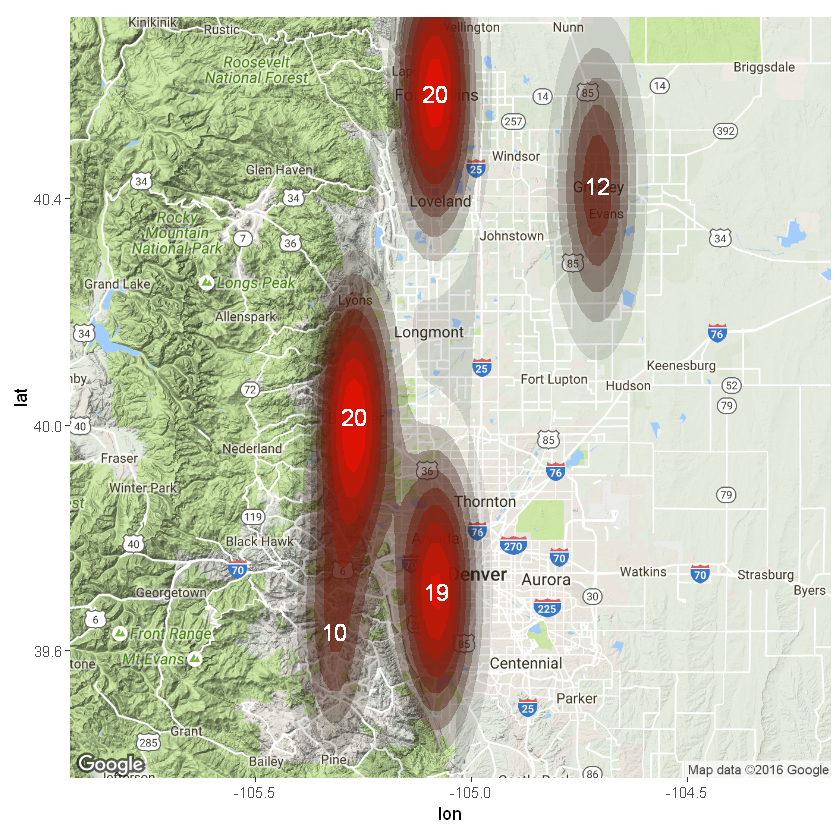

In [150]:
ggmap(map) + stat_density2d(
aes(x = lon, y = lat, fill = ..level.., alpha = ..level..),
size = 10, bins = 10, data = data2inch,
geom = "polygon"
) + scale_fill_gradient(low = "black", high = "red") + geom_text(data=NULL,
            label = labels[1], x = -105.2705456, y = 40.0149856, size = 5, colour = "white")+ geom_text(data=NULL,
            label = labels[2], x = -105.084423, y = 40.5852602, size = 5, colour = "white")+ geom_text(data=NULL,
            label = labels[3], x = -105.0813734, y = 39.7047095, size = 5, colour = "white")+ geom_text(data=NULL,
            label = labels[4], x = -104.7091322, y = 40.4233142, size = 5, colour = "white")+ geom_text(data=NULL,
            label = labels[5], x = -105.3172146, y = 39.6333213, size = 5, colour = "white")+theme(legend.position = "none")           

Warning message:
: Computation failed in `stat_density2d()`:
missing value where TRUE/FALSE needed

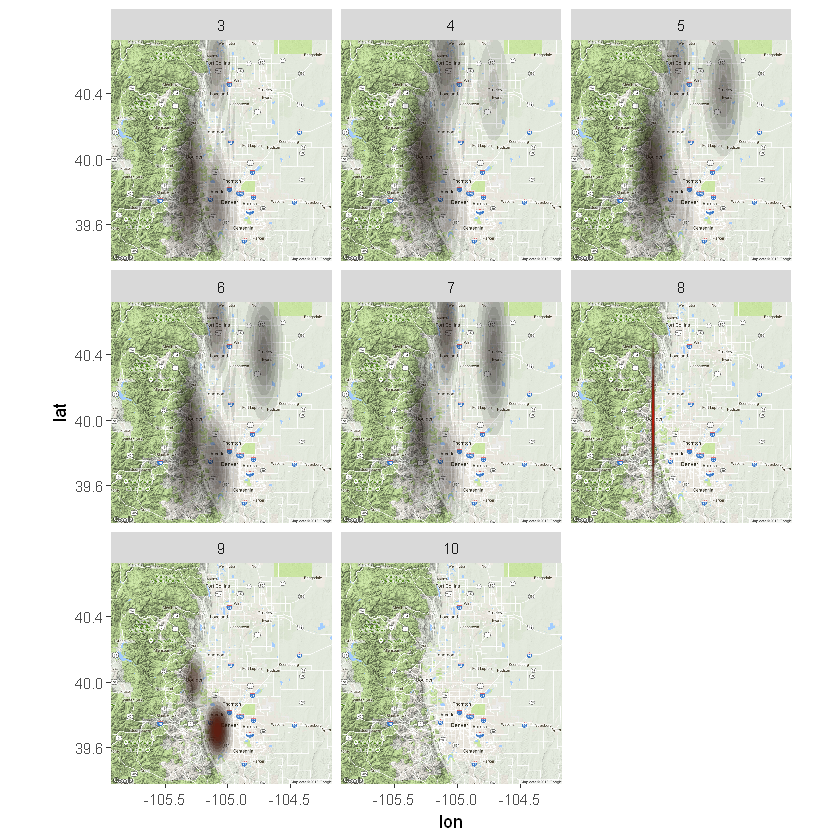

In [151]:
ggmap(map) + stat_density2d(
aes(x = lon, y = lat, fill = ..level.., alpha = ..level..),
size = 10, bins = 10, data = data2inch,
geom = "polygon"
) + scale_fill_gradient(low = "black", high = "red") + facet_wrap(~ MONTH)+theme(legend.position = "none")

## 3 INCH RAINFALL

In [152]:
data3inch = data[which(data$Max.PRCP.>=762),]

In [153]:
labels = as.character(table(data3inch$STATION_NAME))

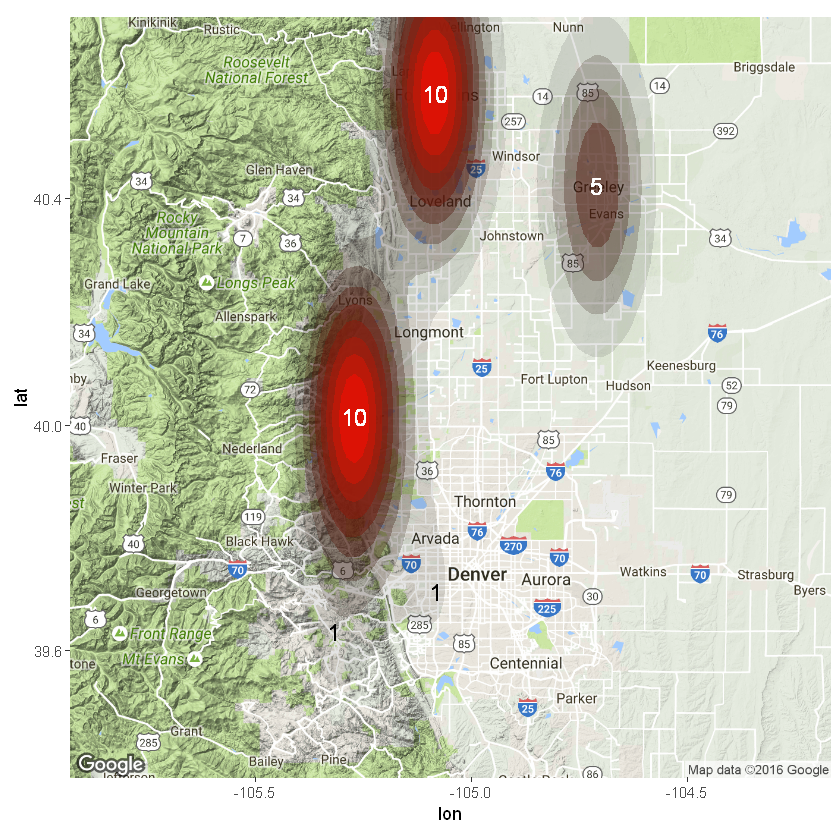

In [154]:
ggmap(map) + stat_density2d(
aes(x = lon, y = lat, fill = ..level.., alpha = ..level..),
size = 10, bins = 10, data = data3inch,
geom = "polygon"
) + scale_fill_gradient(low = "black", high = "red") + geom_text(data=NULL,
            label = labels[1], x = -105.2705456, y = 40.0149856, size = 5, colour = "white")+ geom_text(data=NULL,
            label = labels[2], x = -105.084423, y = 40.5852602, size = 5, colour = "white")+ geom_text(data=NULL,
            label = labels[3], x = -105.0813734, y = 39.7047095, size = 5, colour = "black")+ geom_text(data=NULL,
            label = labels[4], x = -104.7091322, y = 40.4233142, size = 5, colour = "white")+ geom_text(data=NULL,
            label = labels[5], x = -105.3172146, y = 39.6333213, size = 5, colour = "black")+theme(legend.position = "none")

In [155]:
data3inch = data[which(data$Max.PRCP.>=762 & data$YEAR >1961),]

In [156]:
labels = as.character(table(data3inch$STATION_NAME))

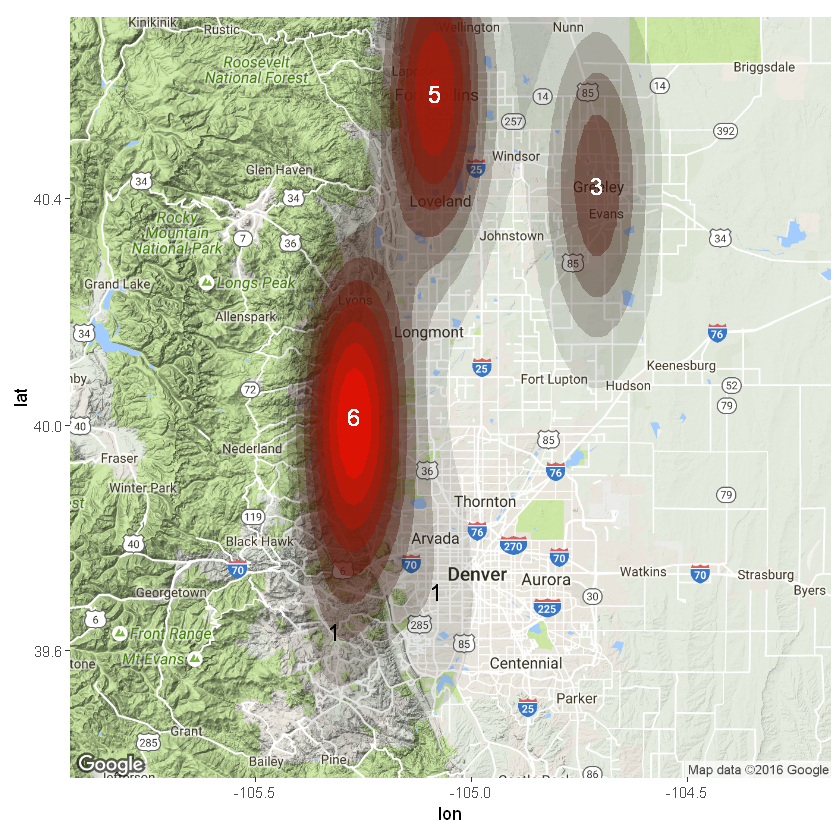

In [157]:
ggmap(map) + stat_density2d(
aes(x = lon, y = lat, fill = ..level.., alpha = ..level..), bins = 10, data = data3inch,
geom = "polygon"
) + scale_fill_gradient(low = "black", high = "red") + geom_text(data=NULL,
            label = labels[1], x = -105.2705456, y = 40.0149856, size = 5, colour = "white")+ geom_text(data=NULL,
            label = labels[2], x = -105.084423, y = 40.5852602, size = 5, colour = "white")+ geom_text(data=NULL,
            label = labels[3], x = -105.0813734, y = 39.7047095, size = 5, colour = "black")+ geom_text(data=NULL,
            label = labels[4], x = -104.7091322, y = 40.4233142, size = 5, colour = "white")+ geom_text(data=NULL,
            label = labels[5], x = -105.3172146, y = 39.6333213, size = 5, colour = "black")+theme(legend.position = "none")

Warning message:
: Computation failed in `stat_density2d()`:
bandwidths must be strictly positiveWarning message:
: Computation failed in `stat_density2d()`:
missing value where TRUE/FALSE neededWarning message:
: Computation failed in `stat_density2d()`:
missing value where TRUE/FALSE needed

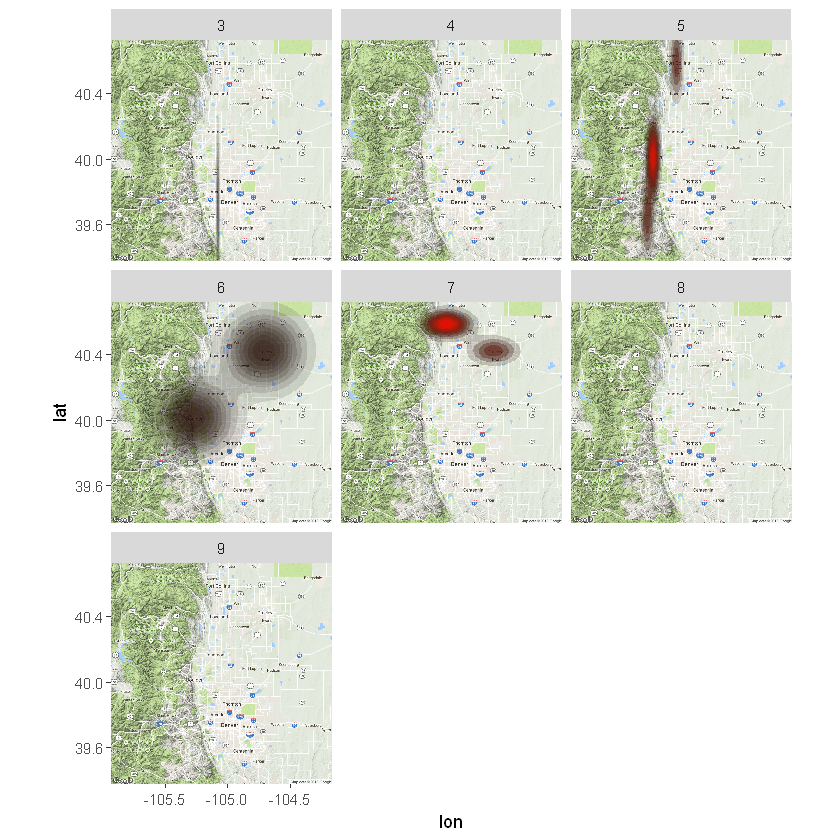

In [158]:
ggmap(map) + stat_density2d(
aes(x = lon, y = lat, fill = ..level.., alpha = ..level..),
size = 10, bins = 10, data = data3inch,
geom = "polygon"
) + scale_fill_gradient(low = "black", high = "red") + facet_wrap(~ MONTH)+theme(legend.position = "none")